In [ ]:
pip install opencv-python


[notice] A new release of pip is available: 23.1 -> 23.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install pydot


[notice] A new release of pip is available: 23.1 -> 23.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install tensorflow-model-optimization


[notice] A new release of pip is available: 23.1 -> 23.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [ ]:
pip install tensorflow-hub


[notice] A new release of pip is available: 23.1 -> 23.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import cv2
import os
from xml.etree import ElementTree
from matplotlib import pyplot as plt
# Any results you write to the current directory are saved as output.

In [ ]:
#%tensorflow_version 2.x  # this line is not required unless you are in a notebook
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from tensorflow.keras import datasets, layers, models
keras = tf.keras

for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


In [ ]:
class_names = ['person','person-like']
class_names_label = {class_name:i for i, class_name in enumerate(class_names)}

n_classes = 2
size = (200,200)

In [ ]:
# Load data function
def load_data():
    datasets = ['Train/Train', 'Test/Test', 'Val/Val']
    output = []

    for dataset in datasets:
        imags = []
        labels = []
        directoryA = "/Users/avyakta/Desktop/Sem2/ESML/Project/archive (9)/" + dataset +"/Annotations"
        directoryIMG = "/Users/avyakta/Desktop/Sem2/ESML/Project/archive (9)/" + dataset +"/JPEGImages/"
        file = os.listdir(directoryA)
        img = os.listdir(directoryIMG)
        file.sort()
        img.sort()

        for xml, img_file in zip(file, img):
            xmlf = os.path.join(directoryA, xml)
            dom = ElementTree.parse(xmlf)
            vb = dom.findall('object')
            label = vb[0].find('name').text
            labels.append(class_names_label[label])

            img_path = os.path.join(directoryIMG, img_file)
            curr_img = cv2.imread(img_path)
            curr_img = cv2.resize(curr_img, size)
            imags.append(curr_img)

        imags = np.array(imags, dtype='float32') / 255
        labels = np.array(labels, dtype='int32')

        output.append((imags, labels))
    return output

In [ ]:
(train_images, train_labels),(test_images, test_labels),(val_images, val_labels) = load_data()

In [ ]:
train_images.shape

(944, 200, 200, 3)

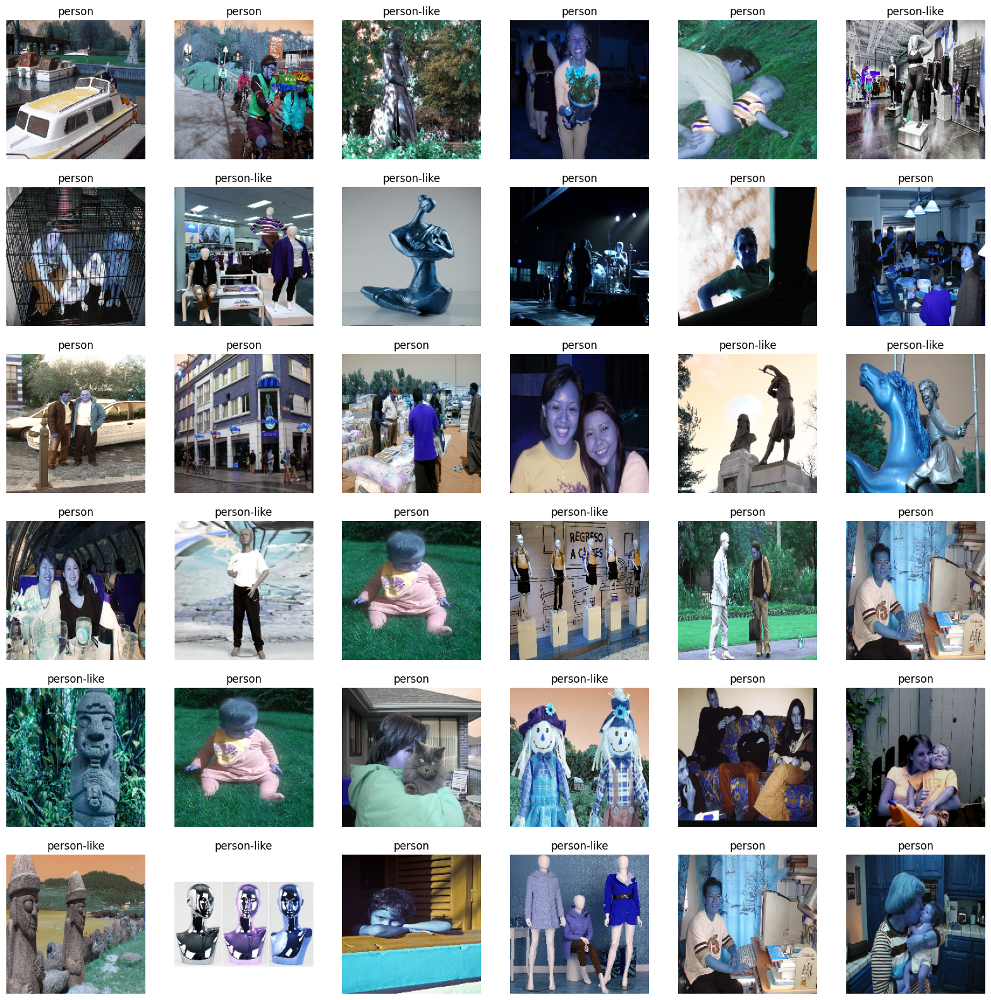

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(train_images),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(train_images[i])
    plt.title(class_names[train_labels[i]])
    plt.axis('off')

In [ ]:
# Define the model architecture
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(200, 200, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(2, activation='softmax'))

In [ ]:
from tensorflow.keras.callbacks import LearningRateScheduler

# Define a learning rate schedule function (you can customize this)
def lr_schedule(epoch):
    initial_lr = 0.001
    decay = 0.9
    if epoch < 5:
        return initial_lr
    else:
        return initial_lr * decay**(epoch - 4)

# Create a LearningRateScheduler callback
lr_callback = LearningRateScheduler(lr_schedule)

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
# Train the model
history = model.fit(train_images, train_labels, epochs=10,
                    validation_data=(val_images, val_labels),callbacks=[lr_callback])

Epoch 1/10


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/backend.py:5714: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


30/30 [==============================] - 12s 388ms/step - loss: 0.9587 - accuracy: 0.5244 - val_loss: 0.6751 - val_accuracy: 0.5312 - lr: 0.0010
Epoch 2/10
30/30 [==============================] - 12s 392ms/step - loss: 0.6458 - accuracy: 0.5689 - val_loss: 0.6006 - val_accuracy: 0.6250 - lr: 0.0010
Epoch 3/10
30/30 [==============================] - 11s 379ms/step - loss: 0.5836 - accuracy: 0.7299 - val_loss: 0.5319 - val_accuracy: 0.7250 - lr: 0.0010
Epoch 4/10
30/30 [==============================] - 11s 380ms/step - loss: 0.4793 - accuracy: 0.7765 - val_loss: 0.5679 - val_accuracy: 0.6812 - lr: 0.0010
Epoch 5/10
30/30 [==============================] - 12s 384ms/step - loss: 0.3739 - accuracy: 0.8390 - val_loss: 0.4633 - val_accuracy: 0.8062 - lr: 0.0010
Epoch 6/10
30/30 [==============================] - 11s 381ms/step - loss: 0.2804 - accuracy: 0.8856 - val_loss: 0.5671 - val_accuracy: 0.7563 - lr: 9.0000e-04
Epoch 7/10
30/30 [==============================] - 11s 381ms/step - lo

In [ ]:
#evaluate
test_loss, test_acc = model.evaluate(test_images,  test_labels)
print('\nTest accuracy:', test_acc)

8/8 [==============================] - 1s 97ms/step - loss: 1.6047 - accuracy: 0.6766

Test accuracy: 0.6765957474708557


In [ ]:
from sklearn.metrics import classification_report, f1_score, roc_auc_score, accuracy_score

# Get model predictions on the test set
y_pred = model.predict(test_images)
y_pred_classes = np.argmax(y_pred, axis=1)

# Print Classification Report
print("Classification Report:")
print(classification_report(test_labels, y_pred_classes, target_names=class_names))

# Print F1 Score
f1 = f1_score(test_labels, y_pred_classes, average='weighted')
print(f"F1 Score: {f1:.4f}")

# Print AUC-ROC Score
auc_roc = roc_auc_score(test_labels, y_pred[:, 1])
print(f"AUC-ROC Score: {auc_roc:.4f}")

# Print Accuracy
accuracy = accuracy_score(test_labels, y_pred_classes)
print(f"Accuracy: {accuracy:.4f}")


8/8 [==============================] - 1s 96ms/step
Classification Report:
              precision    recall  f1-score   support

      person       0.76      0.65      0.70       136
 person-like       0.60      0.72      0.65        99

    accuracy                           0.68       235
   macro avg       0.68      0.68      0.67       235
weighted avg       0.69      0.68      0.68       235

F1 Score: 0.6786
AUC-ROC Score: 0.7510
Accuracy: 0.6766


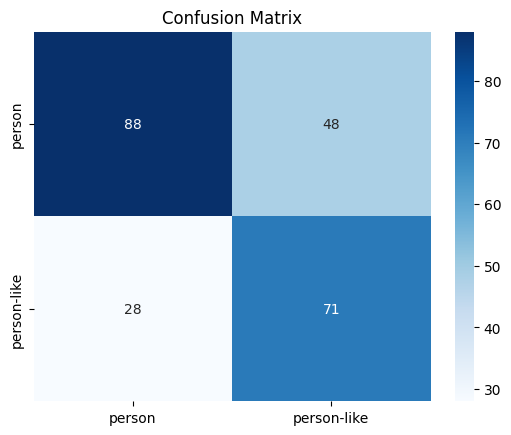

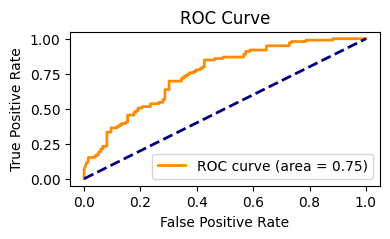

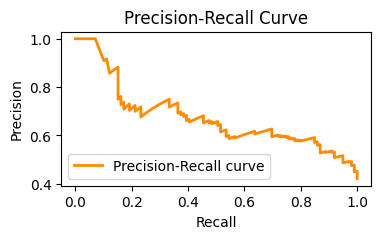

In [ ]:
from sklearn.metrics import confusion_matrix, roc_curve, precision_recall_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
# Confusion Matrix
conf_matrix = confusion_matrix(test_labels, y_pred_classes)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(test_labels, y_pred[:, 1])
plt.figure(figsize=(4,2))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(auc(fpr, tpr)))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(test_labels, y_pred[:, 1])
plt.figure(figsize=(4, 2))
plt.plot(recall, precision, color='darkorange', lw=2, label='Precision-Recall curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='lower left')
plt.show()

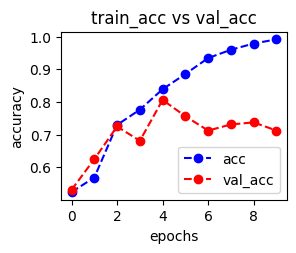

In [ ]:
# Plot accuracy
plt.subplot(221)
plt.plot(history.history['accuracy'],'bo--', label = "acc")
plt.plot(history.history['val_accuracy'], 'ro--', label = "val_acc")
plt.title("train_acc vs val_acc")
plt.ylabel("accuracy")
plt.xlabel("epochs")
plt.legend()
plt.show()

In [ ]:
import tensorflow_model_optimization as tfmot

prune_low_magnitude = tfmot.sparsity.keras.prune_low_magnitude

# Compute end step to finish pruning after 2 epochs.
validation_split = 0.1 # 10% of training set will be used for validation set.

num_images = train_images.shape[0]
end_step = np.ceil(num_images / 128).astype(np.int32) * 20

# Define model for pruning.
pruning_params = {
      'pruning_schedule': tfmot.sparsity.keras.PolynomialDecay(initial_sparsity=0.50,
                                                               final_sparsity=0.80,
                                                               begin_step=0,
                                                               end_step=end_step,
                                                               )
}
model_for_pruning = prune_low_magnitude(model, **pruning_params)

model_for_pruning.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
       loss='sparse_categorical_crossentropy',
          metrics=['accuracy'])
#model_for_pruning.summary()

In [ ]:
import tempfile
import zipfile
import os
# Define a pruning schedule and target sparsity
pruning_schedule = tfmot.sparsity.keras.PolynomialDecay(initial_sparsity=0.0,
                                                        final_sparsity=0.5,
                                                        begin_step=0,
                                                        end_step=2000)

# Apply weight pruning to the model
pruned_model = tfmot.sparsity.keras.prune_low_magnitude(model, pruning_schedule=pruning_schedule)

# Compile the pruned model
pruned_model.compile(optimizer='adam',
                     loss='sparse_categorical_crossentropy',
                     metrics=['accuracy'])
#model_for_pruning.summary()
# Train the pruned model
logdir = tempfile.mkdtemp()

callbacks = [
  tfmot.sparsity.keras.UpdatePruningStep(),
  tfmot.sparsity.keras.PruningSummaries(log_dir=logdir),
]

model_for_pruning.fit(train_images, train_labels,
                  batch_size=128, epochs=5,validation_data=(val_images,val_labels),
                  callbacks=callbacks)

# Evaluate the pruned model
pruned_test_loss, pruned_test_accuracy = pruned_model.evaluate(test_images, test_labels)
print(f'Pruned Model Test accuracy: {pruned_test_accuracy * 100}%')


Epoch 1/5
8/8 [==============================] - 12s 1s/step - loss: 0.0138 - accuracy: 0.9968 - val_loss: 1.1892 - val_accuracy: 0.7500
Epoch 2/5
8/8 [==============================] - 11s 1s/step - loss: 0.0108 - accuracy: 0.9979 - val_loss: 1.2383 - val_accuracy: 0.7563
Epoch 3/5
8/8 [==============================] - 11s 1s/step - loss: 0.0138 - accuracy: 0.9968 - val_loss: 1.1912 - val_accuracy: 0.7563
Epoch 4/5
8/8 [==============================] - 11s 1s/step - loss: 0.0100 - accuracy: 0.9968 - val_loss: 1.1971 - val_accuracy: 0.7437
Epoch 5/5
8/8 [==============================] - 1s 112ms/step - loss: 1.7232 - accuracy: 0.7064
Pruned Model Test accuracy: 70.63829898834229%


In [ ]:
from sklearn.metrics import classification_report, f1_score, roc_auc_score, accuracy_score

# Get model predictions on the test set
y_pred = model_for_pruning.predict(test_images)
y_pred_classes = np.argmax(y_pred, axis=1)

# Print Classification Report
print("Classification Report:")
print(classification_report(test_labels, y_pred_classes, target_names=class_names))

# Print F1 Score
f1 = f1_score(test_labels, y_pred_classes, average='weighted')
print(f"F1 Score: {f1:.4f}")

# Print AUC-ROC Score
auc_roc = roc_auc_score(test_labels, y_pred[:, 1])
print(f"AUC-ROC Score: {auc_roc:.4f}")

# Print Accuracy
accuracy = accuracy_score(test_labels, y_pred_classes)
print(f"Accuracy: {accuracy:.4f}")

8/8 [==============================] - 1s 111ms/step
Classification Report:
              precision    recall  f1-score   support

      person       0.74      0.75      0.75       136
 person-like       0.65      0.65      0.65        99

    accuracy                           0.71       235
   macro avg       0.70      0.70      0.70       235
weighted avg       0.71      0.71      0.71       235

F1 Score: 0.7062
AUC-ROC Score: 0.7652
Accuracy: 0.7064


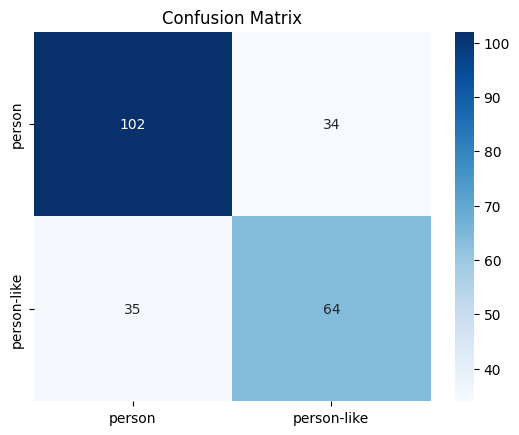

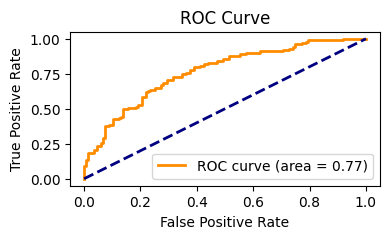

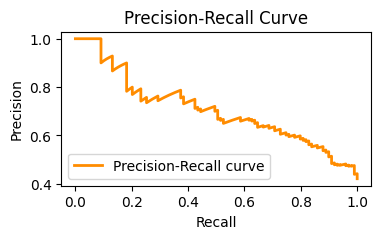

In [ ]:
from sklearn.metrics import confusion_matrix, roc_curve, precision_recall_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
# Confusion Matrix
conf_matrix = confusion_matrix(test_labels, y_pred_classes)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(test_labels, y_pred[:, 1])
plt.figure(figsize=(4,2))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(auc(fpr, tpr)))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(test_labels, y_pred[:, 1])
plt.figure(figsize=(4, 2))
plt.plot(recall, precision, color='darkorange', lw=2, label='Precision-Recall curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='lower left')
plt.show()

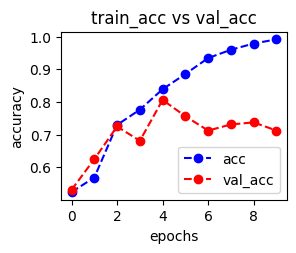

In [ ]:
# Plot accuracy
plt.subplot(221)
plt.plot(history.history['accuracy'],'bo--', label = "acc")
plt.plot(history.history['val_accuracy'], 'ro--', label = "val_acc")
plt.title("train_acc vs val_acc")
plt.ylabel("accuracy")
plt.xlabel("epochs")
plt.legend()
plt.show()

In [ ]:
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from sklearn.metrics import confusion_matrix

base_model = MobileNetV2(input_shape=(200, 200, 3), include_top=False, weights=None)

# Specify the full path to the manually downloaded weights file
weights_path = "/Users/avyakta/Desktop/Sem2/ESML/Project/mobilenet_v2_weights_tf_dim_ordering_tf_kernels_1.0_224_no_top.h5"

# Load the weights from the local file
base_model.load_weights(weights_path)

# Freeze the pre-trained layers
base_model.trainable = False

# Create the transfer learning model
model_tl = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dense(2)
])

# Compile the model
model_tl.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# Train the model
history = model_tl.fit(train_images, train_labels, epochs=15,
                    validation_data=(test_images, test_labels))

# Evaluate the model
test_loss, test_acc = model_tl.evaluate(test_images, test_labels)
print('\nTest accuracy after transfer learning:', test_acc)

Epoch 1/15
30/30 [==============================] - 6s 166ms/step - loss: 0.4014 - accuracy: 0.8252 - val_loss: 0.3621 - val_accuracy: 0.8511
Epoch 2/15
30/30 [==============================] - 5s 159ms/step - loss: 0.1424 - accuracy: 0.9492 - val_loss: 0.3353 - val_accuracy: 0.8766
Epoch 3/15
30/30 [==============================] - 5s 155ms/step - loss: 0.0891 - accuracy: 0.9767 - val_loss: 0.3553 - val_accuracy: 0.8681
Epoch 4/15
30/30 [==============================] - 5s 158ms/step - loss: 0.0666 - accuracy: 0.9799 - val_loss: 0.3488 - val_accuracy: 0.8638
Epoch 5/15
30/30 [==============================] - 5s 159ms/step - loss: 0.0442 - accuracy: 0.9936 - val_loss: 0.3505 - val_accuracy: 0.8894
Epoch 6/15
30/30 [==============================] - 5s 158ms/step - loss: 0.0301 - accuracy: 0.9958 - val_loss: 0.3729 - val_accuracy: 0.8681
Epoch 7/15
30/30 [==============================] - 5s 160ms/step - loss: 0.0204 - accuracy: 0.9989 - val_loss: 0.3903 - val_accuracy: 0.8681
Epoch 

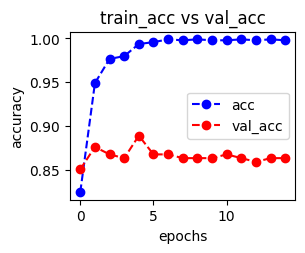

In [ ]:
# Plot accuracy
plt.subplot(221)
plt.plot(history.history['accuracy'],'bo--', label = "acc")
plt.plot(history.history['val_accuracy'], 'ro--', label = "val_acc")
plt.title("train_acc vs val_acc")
plt.ylabel("accuracy")
plt.xlabel("epochs")
plt.legend()
plt.show()

In [ ]:
model.save('/Users/avyakta/Desktop/Sem2/ESML/Project/model_tl.h5')

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import plot_model

# Load the model from the .h5 file
model = load_model('model_tl.h5')  # Replace with the actual file path

# Plot the model architecture and save it to a file
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [ ]:
from sklearn.metrics import classification_report, f1_score, roc_auc_score, accuracy_score

# Get model predictions on the test set
y_pred = model_tl.predict(test_images)
y_pred_classes = np.argmax(y_pred, axis=1)

# Print Classification Report
print("Classification Report:")
print(classification_report(test_labels, y_pred_classes, target_names=class_names))

# Print F1 Score
f1 = f1_score(test_labels, y_pred_classes, average='weighted')
print(f"F1 Score: {f1:.4f}")

# Print AUC-ROC Score
auc_roc = roc_auc_score(test_labels, y_pred[:, 1])
print(f"AUC-ROC Score: {auc_roc:.4f}")

# Print Accuracy
accuracy = accuracy_score(test_labels, y_pred_classes)
print(f"Accuracy: {accuracy:.4f}")


8/8 [==============================] - 1s 117ms/step
Classification Report:
              precision    recall  f1-score   support

      person       0.89      0.87      0.88       136
 person-like       0.83      0.86      0.84        99

    accuracy                           0.86       235
   macro avg       0.86      0.86      0.86       235
weighted avg       0.86      0.86      0.86       235

F1 Score: 0.8642
AUC-ROC Score: 0.9431
Accuracy: 0.8638


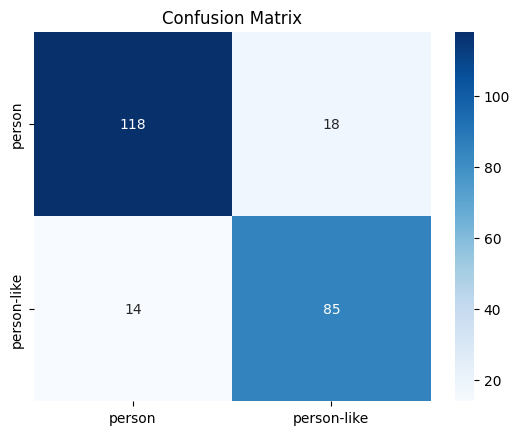

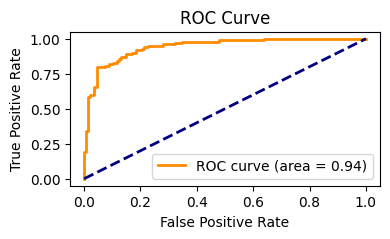

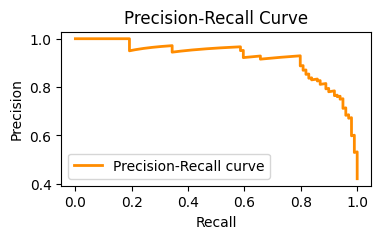

In [ ]:
from sklearn.metrics import confusion_matrix, roc_curve, precision_recall_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
# Confusion Matrix
conf_matrix = confusion_matrix(test_labels, y_pred_classes)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(test_labels, y_pred[:, 1])
plt.figure(figsize=(4, 2))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(auc(fpr, tpr)))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Precision-Recall Curve
precision, recall, _ = precision_recall_curve(test_labels, y_pred[:, 1])
plt.figure(figsize=(4, 2))
plt.plot(recall, precision, color='darkorange', lw=2, label='Precision-Recall curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='lower left')
plt.show()

In [ ]:
def plot_accuracy_loss(history):
    """
        Plot the accuracy and the loss during the training of the nn.
    """
    fig = plt.figure(figsize=(10,5))

    # Plot accuracy
    plt.subplot(221)
    plt.plot(history.history['accuracy'],'bo--', label = "acc")
    plt.plot(history.history['val_accuracy'], 'ro--', label = "val_acc")
    plt.title("train_acc vs val_acc")
    plt.ylabel("accuracy")
    plt.xlabel("epochs")
    plt.legend()

    # Plot loss function
    plt.subplot(222)
    plt.plot(history.history['loss'],'bo--', label = "loss")
    plt.plot(history.history['val_loss'], 'ro--', label = "val_loss")
    plt.title("train_loss vs val_loss")
    plt.ylabel("loss")
    plt.xlabel("epochs")

    plt.legend()
    plt.show()

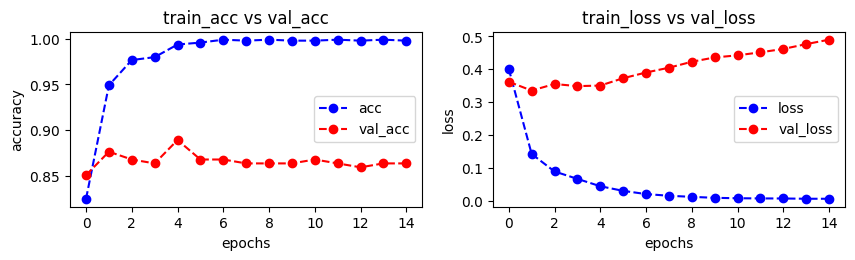

In [ ]:
plot_accuracy_loss(history)

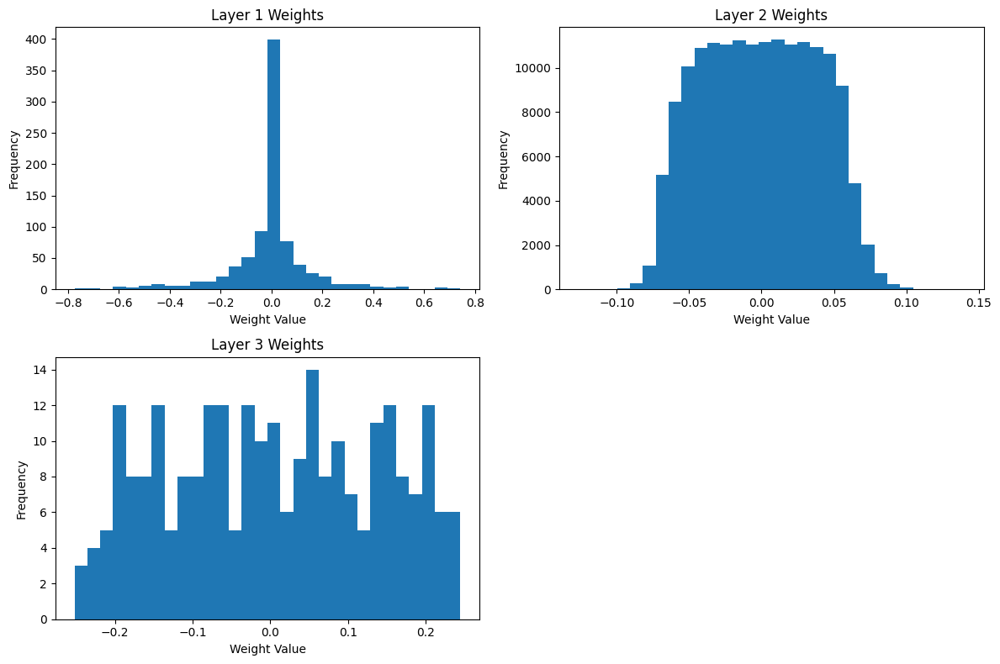

In [ ]:
# Get the weights from the model
weights = [layer.get_weights() for layer in model_tl.layers if layer.get_weights()]

# Flatten the weights and plot histograms
plt.figure(figsize=(12, 8))
for i, w in enumerate(weights):
    plt.subplot(2, len(weights)//2 + 1, i+1)

    # Check the dimensionality of the weight array
    if len(w) == 0:
        # Handle the case where the layer has no weights (e.g., activation layers)
        continue
    elif len(w[0].shape) == 1:
        # Flatten 1D weights (e.g., biases in dense layers)
        plt.hist(w[0].ravel(), bins=30)
    else:
        # Flatten 2D or 4D weights
        plt.hist(np.concatenate(w[0]).ravel(), bins=30)

    plt.title(f'Layer {i+1} Weights')
    plt.xlabel('Weight Value')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [ ]:
preds = model.predict(val_images)

5/5 [==============================] - 1s 105ms/step


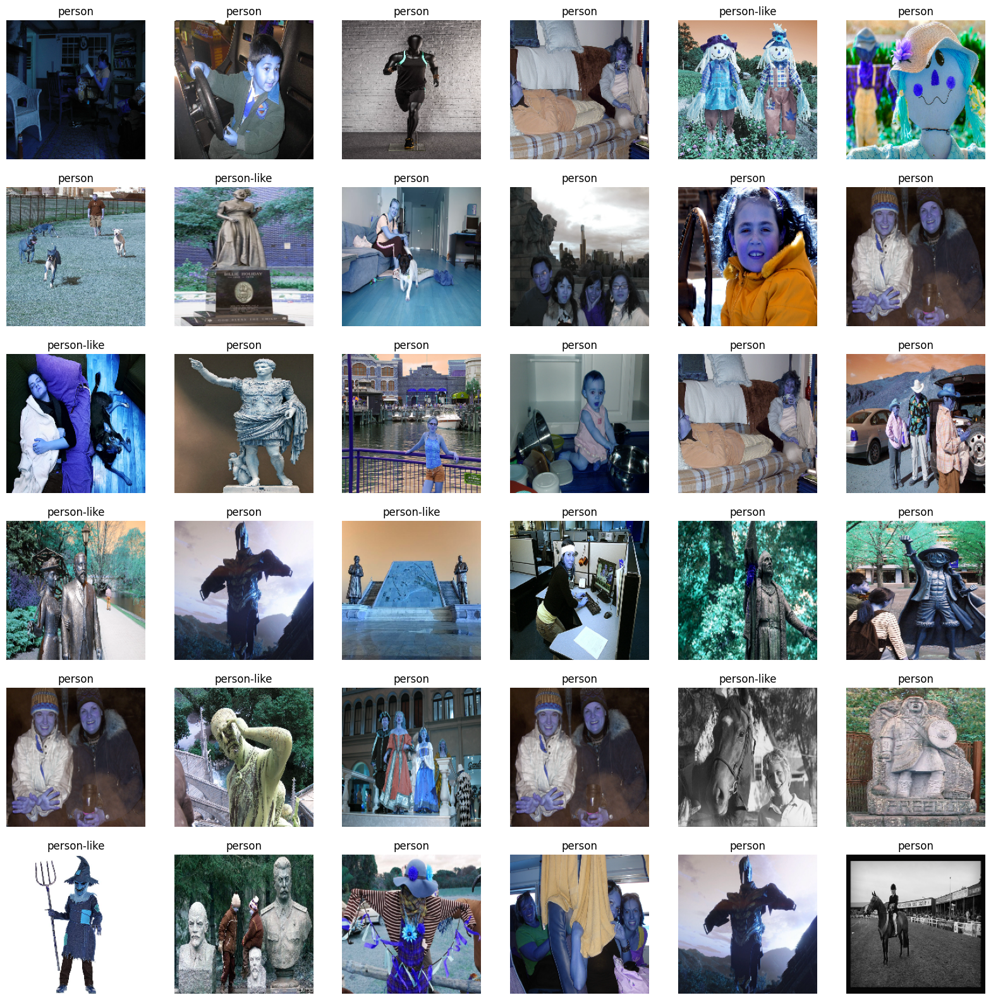

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(val_images),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(val_images[i])
    plt.axis('off')
    x =np.argmax(preds[i]) # takes the maximum of of the 6 probabilites.
    plt.title((class_names[x]))

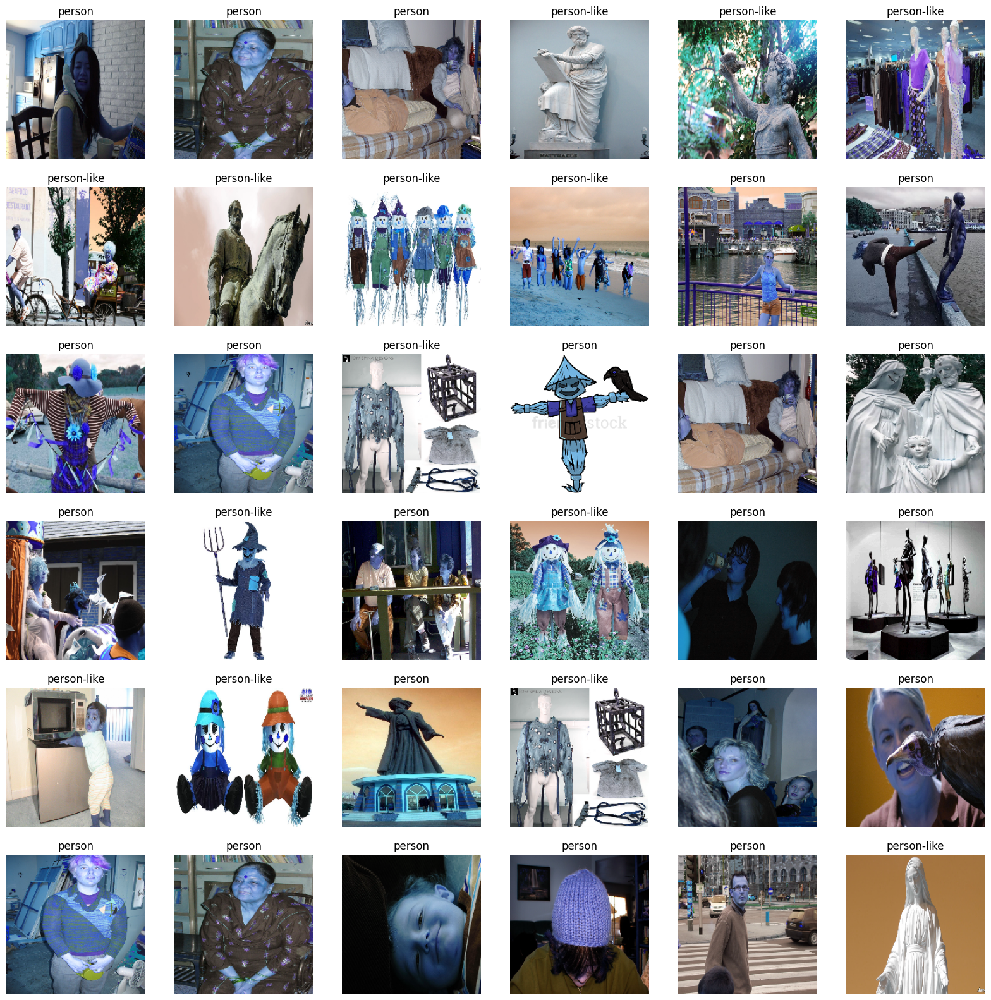

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(val_images),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(val_images[i])
    plt.axis('off')
    x =np.argmax(preds[i]) # takes the maximum of of the 6 probabilites.
    plt.title((class_names[x]))

In [ ]:
result = []
for i in range(len(preds)):
    result.append(np.argmax(preds[i]))

In [ ]:
tn, fp, fn, tp = confusion_matrix(val_labels,result).ravel()

In [ ]:
(tn, fp, fn, tp)

(74, 11, 27, 48)

In [ ]:
import cv2

# Load the pre-trained MobileNet SSD model
model_weights = '/Users/avyakta/Desktop/MobileNetSSD_deploy.caffemodel'
model_cfg = '/Users/avyakta/Desktop/MobileNetSSD_deploy.prototxt'
net = cv2.dnn.readNetFromCaffe(model_cfg, model_weights)

# Set the desired confidence threshold
confidence_threshold = 0.5

# Start capturing video from the webcam
cap = cv2.VideoCapture(0)  # Use 0 for the default webcam

# Define the output video codec and frame rate
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('output.avi', fourcc, 7.0, (640, 480))

while True:
    ret, frame = cap.read()
    if not ret:
        break


    blob = cv2.dnn.blobFromImage(cv2.resize(frame, (300, 300)), 0.007843, (300, 300), 127.5)

    # Setting the input to the network and perform a forward pass
    net.setInput(blob)
    detections = net.forward()

    # Loop over the detections
    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]

        # Filtering out weak detections by confidence threshold
        if confidence > confidence_threshold:
            class_id = int(detections[0, 0, i, 1])

            # Get the bounding box coordinates
            box = detections[0, 0, i, 3:7] * [frame.shape[1], frame.shape[0], frame.shape[1], frame.shape[0]]
            (startX, startY, endX, endY) = box.astype("int")

            # Draw the bounding box and label on the frame
            label = f"Object: {confidence:.2f}"
            cv2.rectangle(frame, (startX, startY), (endX, endY), (0, 255, 0), 2)
            cv2.putText(frame, label, (startX, startY - 15), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Writing the frame with detected objects into the output video
    out.write(frame)

# Release the video capture and output video
cap.release()
out.release()